In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import time
from sklearn.feature_selection import mutual_info_classif
import scipy.stats as ss
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.inspection import permutation_importance
import time
import pickle
import lime
import lime.lime_tabular

In [2]:
#pip install shap

In [3]:
#pip install lime

In [2]:
df = pd.read_csv('combined_data.csv')

In [3]:
bins = [2000, 2400, 2800, 3200, 3400, np.inf] #define bin edges
labels = ['lowest', 'low', 'medium', 'high', 'highest']  # Define labels for the bins
df['target_discrete'] = pd.cut(df['yearly_final_cost'], bins=bins, labels=labels, include_lowest=True)

In [4]:
print(df['target_discrete'].value_counts(dropna=False))

highest    168349
high        11617
medium      10534
lowest          0
low             0
Name: target_discrete, dtype: int64


In [28]:
# We will create less categories due to imbalanced classes

# Feature importance and model training before PCA

In [29]:
# Define the number of bins (classes) and create bins with equal count
num_bins = 4
df['cost_category'] = pd.qcut(df['yearly_final_cost'], q=num_bins, labels=False)  # Ensure equal number of observations
bin_labels = ['Lowest', 'Low', 'Medium', 'High']
df['cost_category'] = pd.qcut(df['yearly_final_cost'], q=num_bins, labels=bin_labels)

# Drop unnecessary columns for modeling
drop_cols = ['yearly_final_cost', 'target_discrete']
df = df.drop(drop_cols, axis=1)

# Split data into features (X) and target (y)
X = df.drop('cost_category', axis=1)
y = df['cost_category']

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Fit a Random Forest model
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)

# Get feature importances
feature_importances = rf.feature_importances_

# Create a DataFrame for feature importances
importance_df = pd.DataFrame({
    'feature': X.columns,
    'importance': feature_importances
}).sort_values(by='importance', ascending=False)

# Display the feature importances
print("### Feature Importances ###")
print(importance_df.head(50))  # Display top 50 features

# Save objects to pickle
with open('df_cleaned.pkl', 'wb') as f:
    pickle.dump(df, f)
with open('X_scaled.pkl', 'wb') as f:
    pickle.dump(X_scaled, f)
with open('X_train.pkl', 'wb') as f:
    pickle.dump(X_train, f)
with open('X_test.pkl', 'wb') as f:
    pickle.dump(X_test, f)
with open('y_train.pkl', 'wb') as f:
    pickle.dump(y_train, f)
with open('y_test.pkl', 'wb') as f:
    pickle.dump(y_test, f)
with open('rf_feature_importance.pkl', 'wb') as f:
    pickle.dump(rf, f)
with open('feature_importances.pkl', 'wb') as f:
    pickle.dump(feature_importances, f)
with open('importance_df.pkl', 'wb') as f:
    pickle.dump(importance_df, f)

# Predict using the loaded Random Forest model
y_pred = rf.predict(X_test)

# Evaluate the model's performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print(f'Accuracy before PCA: {accuracy:.2f}')
print('Classification Report before PCA:')
print(report)
print('Confusion Matrix before PCA:')
print(conf_matrix)

# Save accuracy, classification report, and confusion matrix
with open('rf_performance.pkl', 'wb') as file:
    pickle.dump({'accuracy': accuracy, 'classification_report': report, 'confusion_matrix': conf_matrix}, file)

### Feature Importances ###
                               feature  importance
18                   stranger_friendly    0.165865
16                        kid_friendly    0.136470
3                                 size    0.082437
2                            longevity    0.051265
17                        dog_friendly    0.046680
23                      exercise_needs    0.037108
47                      severity_score    0.026846
11               intelligence_category    0.024222
14              tolerates_cold_weather    0.023627
20                          prey_drive    0.021773
22                wanderlust_potential    0.019942
24                        energy_level    0.018324
21            tendency_to_bark_or_howl    0.017966
12                   sensitivity_level    0.016307
19            potential_for_mouthiness    0.016061
13               tolerates_being_alone    0.015073
4                   category_companion    0.014662
15               tolerates_hot_weather    0.014048
7  

In [5]:
# Load objects from pickle
with open('df_cleaned.pkl', 'rb') as f:
    df = pickle.load(f)
with open('X_scaled.pkl', 'rb') as f:
    X_scaled = pickle.load(f)
with open('X_train.pkl', 'rb') as f:
    X_train = pickle.load(f)
with open('X_test.pkl', 'rb') as f:
    X_test = pickle.load(f)
with open('y_train.pkl', 'rb') as f:
    y_train = pickle.load(f)
with open('y_test.pkl', 'rb') as f:
    y_test = pickle.load(f)
with open('rf_feature_importance.pkl', 'rb') as f:
    rf = pickle.load(f)
with open('feature_importances.pkl', 'rb') as f:
    feature_importances = pickle.load(f)
with open('importance_df.pkl', 'rb') as f:
    importance_df = pickle.load(f)

Accuracy before PCA: 1.00
Classification Report before PCA:
              precision    recall  f1-score   support

        High       1.00      1.00      1.00      9339
         Low       1.00      1.00      1.00      9726
      Lowest       1.00      1.00      1.00      9416
      Medium       1.00      1.00      1.00      9619

    accuracy                           1.00     38100
   macro avg       1.00      1.00      1.00     38100
weighted avg       1.00      1.00      1.00     38100

Confusion Matrix before PCA:
[[9333    0    0    6]
 [   0 9723    0    3]
 [   0    2 9414    0]
 [   5   17    1 9596]]


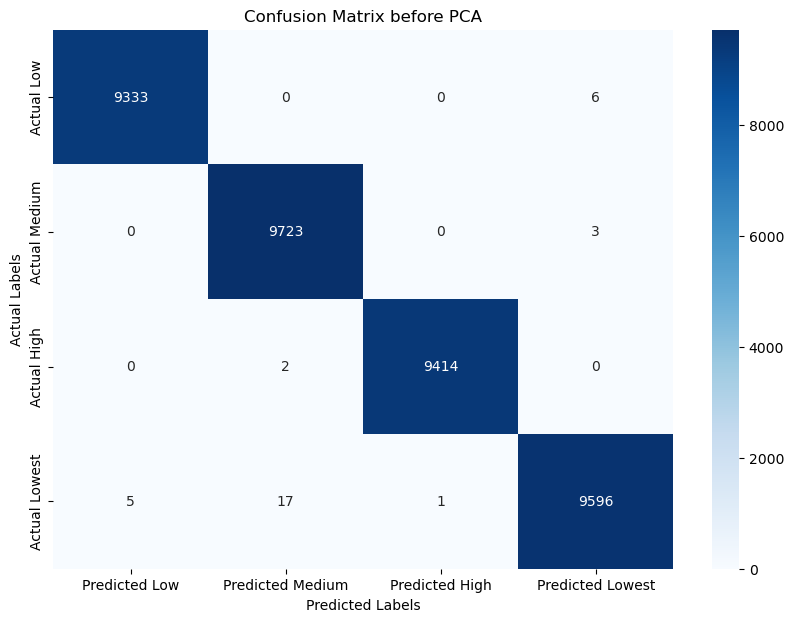

In [6]:
# Load performance metrics from pickle
with open('rf_performance.pkl', 'rb') as file:
    performance = pickle.load(file)

# Extract performance metrics
accuracy = performance['accuracy']
classification_report = performance['classification_report']
confusion_matrix = performance['confusion_matrix']

# Display the accuracy
print(f'Accuracy before PCA: {accuracy:.2f}')

# Display the classification report
print('Classification Report before PCA:')
print(classification_report)

# Display the confusion matrix
print('Confusion Matrix before PCA:')
print(confusion_matrix)

# Plot the confusion matrix
conf_matrix_df = pd.DataFrame(confusion_matrix, 
                              index=['Actual Low', 'Actual Medium', 'Actual High', 'Actual Lowest'],
                              columns=['Predicted Low', 'Predicted Medium', 'Predicted High', 'Predicted Lowest'])

plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_df, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix before PCA')
plt.xlabel('Predicted Labels')
plt.ylabel('Actual Labels')
plt.show()

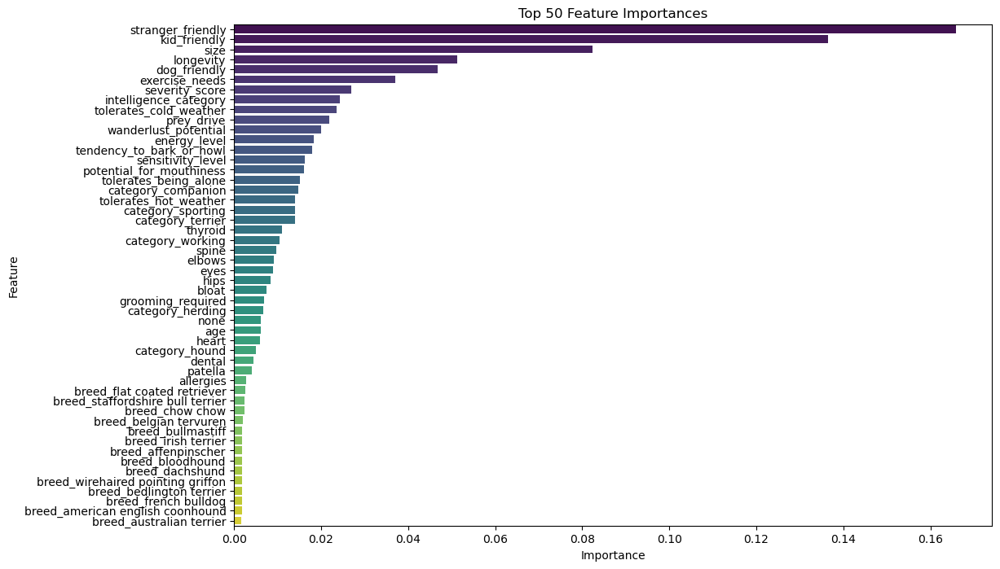

In [7]:
# Plot the top 50 feature importances
top_50_features = importance_df.head(50)

plt.figure(figsize=(12, 8))
sns.barplot(x='importance', y='feature', data=top_50_features, palette='viridis')
plt.title('Top 50 Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

In [8]:
# Count the occurrences of each unique value in yearly_final_cost
value_counts = df['cost_category'].value_counts()

print("Value Counts:")
print(value_counts)

Value Counts:
Low       47915
Lowest    47756
Medium    47657
High      47172
Name: cost_category, dtype: int64


In [9]:
# Print the bin edges
print("Bin Edges:")
print(bins)

Bin Edges:
[2000, 2400, 2800, 3200, 3400, inf]


# Feature importance and model training after PCA

Accuracy after PCA: 1.00
Classification Report after PCA:
              precision    recall  f1-score   support

        High       1.00      1.00      1.00      9339
         Low       1.00      1.00      1.00      9726
      Lowest       1.00      1.00      1.00      9416
      Medium       1.00      1.00      1.00      9619

    accuracy                           1.00     38100
   macro avg       1.00      1.00      1.00     38100
weighted avg       1.00      1.00      1.00     38100

Confusion Matrix after PCA:
[[9339    0    0    0]
 [   0 9726    0    0]
 [   0    0 9416    0]
 [   0    3    0 9616]]


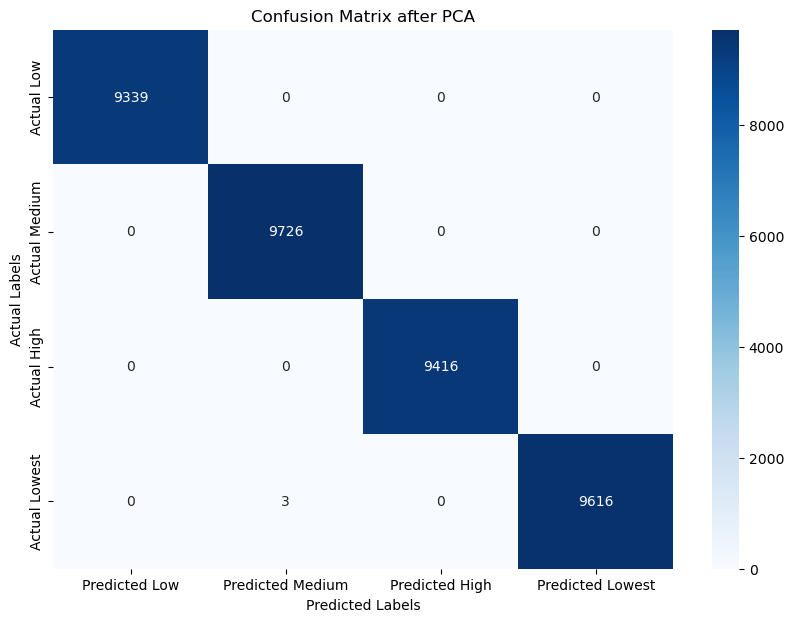

In [32]:
# Load saved data
with open('X_train.pkl', 'rb') as f:
    X_train = pickle.load(f)
with open('X_test.pkl', 'rb') as f:
    X_test = pickle.load(f)
with open('y_train.pkl', 'rb') as f:
    y_train = pickle.load(f)
with open('y_test.pkl', 'rb') as f:
    y_test = pickle.load(f)

# Apply PCA
pca = PCA(n_components=0.95)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

# Fit a Random Forest model
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train_pca, y_train)

# Predict using the Random Forest model
y_pred = rf.predict(X_test_pca)

# Evaluate the model's performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

# Display the metrics
print(f'Accuracy after PCA: {accuracy:.2f}')
print('Classification Report after PCA:')
print(report)
print('Confusion Matrix after PCA:')
print(conf_matrix)

# Plot the confusion matrix
conf_matrix_df = pd.DataFrame(conf_matrix, 
                              index=['Actual Low', 'Actual Medium', 'Actual High', 'Actual Lowest'],
                              columns=['Predicted Low', 'Predicted Medium', 'Predicted High', 'Predicted Lowest'])

plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_df, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix after PCA')
plt.xlabel('Predicted Labels')
plt.ylabel('Actual Labels')
plt.show()

# Save objects to pickle
with open('X_train_pca.pkl', 'wb') as f:
    pickle.dump(X_train_pca, f)
with open('X_test_pca.pkl', 'wb') as f:
    pickle.dump(X_test_pca, f)
with open('rf_model_after_pca.pkl', 'wb') as f:
    pickle.dump(rf, f)
with open('pca.pkl', 'wb') as f:
    pickle.dump(pca, f)
with open('rf_performance_after_pca.pkl', 'wb') as f:
    pickle.dump({'accuracy': accuracy, 'classification_report': report, 'confusion_matrix': conf_matrix}, f)

Accuracy after PCA: 1.00
Classification Report after PCA:
              precision    recall  f1-score   support

        High       1.00      1.00      1.00      9339
         Low       1.00      1.00      1.00      9726
      Lowest       1.00      1.00      1.00      9416
      Medium       1.00      1.00      1.00      9619

    accuracy                           1.00     38100
   macro avg       1.00      1.00      1.00     38100
weighted avg       1.00      1.00      1.00     38100

Confusion Matrix after PCA:
[[9339    0    0    0]
 [   0 9726    0    0]
 [   0    0 9416    0]
 [   0    3    0 9616]]


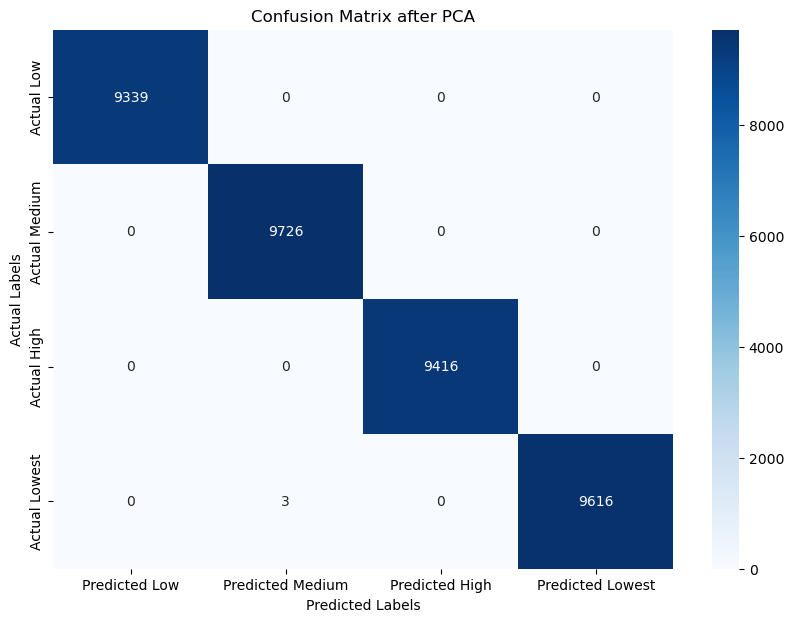

In [10]:
# Load objects from pickle
with open('X_train_pca.pkl', 'rb') as f:
    X_train_pca = pickle.load(f)
with open('X_test_pca.pkl', 'rb') as f:
    X_test_pca = pickle.load(f)
with open('rf_model_after_pca.pkl', 'rb') as f:
    rf = pickle.load(f)
with open('pca.pkl', 'rb') as f:
    pca = pickle.load(f)
with open('rf_performance_after_pca.pkl', 'rb') as f:
    performance = pickle.load(f)

# Extract performance metrics
accuracy = performance['accuracy']
classification_report = performance['classification_report']
confusion_matrix = performance['confusion_matrix']

# Display the accuracy
print(f'Accuracy after PCA: {accuracy:.2f}')

# Display the classification report
print('Classification Report after PCA:')
print(classification_report)

# Display the confusion matrix
print('Confusion Matrix after PCA:')
print(confusion_matrix)

# Plot the confusion matrix
conf_matrix_df = pd.DataFrame(confusion_matrix, 
                              index=['Actual Low', 'Actual Medium', 'Actual High', 'Actual Lowest'],
                              columns=['Predicted Low', 'Predicted Medium', 'Predicted High', 'Predicted Lowest'])

plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_df, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix after PCA')
plt.xlabel('Predicted Labels')
plt.ylabel('Actual Labels')
plt.show()

# Feature selection 

In [11]:
# Drop variables with less than 0.01 importance
# Fit Random Forest model on the entire dataset to get feature importances
rf = RandomForestClassifier(random_state=42)
X = df.drop('cost_category', axis=1)  
y = df['cost_category']

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit the Random Forest model
rf.fit(X_scaled, y)

# Get feature importances
feature_importances = rf.feature_importances_

# Create a DataFrame for feature importances
importance_df = pd.DataFrame({
    'feature': X.columns,
    'importance': feature_importances
}).sort_values(by='importance', ascending=False)

# Filter features with importance >= 0.01
important_features = importance_df[importance_df['importance'] >= 0.01]['feature'].tolist()

# Subset the original DataFrame to include only these important features
X_filtered = df[important_features]

# Standardize the filtered features
X_filtered_scaled = scaler.fit_transform(X_filtered)

# Split data into training and testing sets
X_train_filtered, X_test_filtered, y_train, y_test = train_test_split(X_filtered_scaled, y, test_size=0.2, random_state=42)

# Fit a new Random Forest model on the filtered features
rf_filtered = RandomForestClassifier(random_state=42)
rf_filtered.fit(X_train_filtered, y_train)

# Evaluate the new model
print("New Model Performance:")
print(f"Training Accuracy: {rf_filtered.score(X_train_filtered, y_train)}")
print(f"Testing Accuracy: {rf_filtered.score(X_test_filtered, y_test)}")

# Display the filtered features and their importances
print("### Filtered Feature Importances ###")
filtered_importance_df = importance_df[importance_df['importance'] >= 0.01]
print(filtered_importance_df) #new df with features selected (filtered)

New Model Performance:
Training Accuracy: 1.0
Testing Accuracy: 1.0
### Filtered Feature Importances ###
                     feature  importance
18         stranger_friendly    0.166239
16              kid_friendly    0.136283
3                       size    0.092940
2                  longevity    0.049126
17              dog_friendly    0.046296
23            exercise_needs    0.043110
47            severity_score    0.027761
11     intelligence_category    0.024481
14    tolerates_cold_weather    0.023679
20                prey_drive    0.021269
24              energy_level    0.018165
22      wanderlust_potential    0.017119
12         sensitivity_level    0.016917
21  tendency_to_bark_or_howl    0.016500
19  potential_for_mouthiness    0.014757
7          category_sporting    0.014337
13     tolerates_being_alone    0.013899
15     tolerates_hot_weather    0.012659
8           category_terrier    0.011854
34                      hips    0.011843
45                   thyroid    0.

In [35]:
# Save
with open('important_features.pkl', 'wb') as f:
    pickle.dump(important_features, f)
with open('X_filtered.pkl', 'wb') as f:
    pickle.dump(X_filtered, f)
with open('X_filtered_scaled.pkl', 'wb') as f:
    pickle.dump(X_filtered_scaled, f)
with open('X_train_filtered.pkl', 'wb') as f:
    pickle.dump(X_train_filtered, f)
with open('X_test_filtered.pkl', 'wb') as f:
    pickle.dump(X_test_filtered, f)
with open('rf_filtered.pkl', 'wb') as f:
    pickle.dump(rf_filtered, f)
with open('filtered_importance_df.pkl', 'wb') as f:
    pickle.dump(filtered_importance_df, f)

In [21]:
# Load
with open('important_features.pkl', 'rb') as f:
    important_features = pickle.load(f)
with open('X_filtered.pkl', 'rb') as f:
    X_filtered = pickle.load(f)
with open('X_filtered_scaled.pkl', 'rb') as f:
    X_filtered_scaled = pickle.load(f)
with open('X_train_filtered.pkl', 'rb') as f:
    X_train_filtered = pickle.load(f)
with open('X_test_filtered.pkl', 'rb') as f:
    X_test_filtered = pickle.load(f)
with open('rf_filtered.pkl', 'rb') as f:
    rf_filtered = pickle.load(f)
with open('filtered_importance_df.pkl', 'rb') as f:
    filtered_importance_df = pickle.load(f)

# Evaluate the new model
print("New Model Performance:")
print(f"Training Accuracy: {rf_filtered.score(X_train_filtered, y_train)}")
print(f"Testing Accuracy: {rf_filtered.score(X_test_filtered, y_test)}")

# Display the filtered features and their importances
print("### Filtered Feature Importances ###")
print(filtered_importance_df)

New Model Performance:
Training Accuracy: 1.0
Testing Accuracy: 1.0
### Filtered Feature Importances ###
                     feature  importance
18         stranger_friendly    0.165865
16              kid_friendly    0.136470
3                       size    0.082437
2                  longevity    0.051265
17              dog_friendly    0.046680
23            exercise_needs    0.037108
47            severity_score    0.026846
11     intelligence_category    0.024222
14    tolerates_cold_weather    0.023627
20                prey_drive    0.021773
22      wanderlust_potential    0.019942
24              energy_level    0.018324
21  tendency_to_bark_or_howl    0.017966
12         sensitivity_level    0.016307
19  potential_for_mouthiness    0.016061
13     tolerates_being_alone    0.015073
4         category_companion    0.014662
15     tolerates_hot_weather    0.014048
7          category_sporting    0.014030
8           category_terrier    0.013990
45                   thyroid    0.

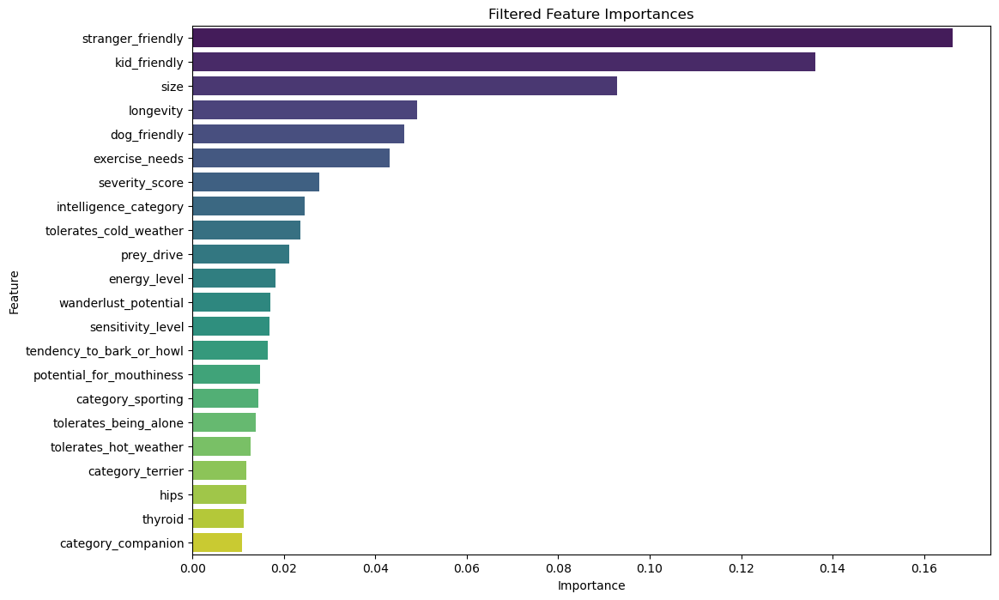

In [12]:
# Filtered feature importances
filtered_features = filtered_importance_df

plt.figure(figsize=(12, 8))
sns.barplot(x='importance', y='feature', data=filtered_features, palette='viridis')
plt.title('Filtered Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

# Cross-validation

In [16]:
# Cross validation
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier

# Initialize the Random Forest model
rf_filtered = RandomForestClassifier(random_state=42)

# Perform cross-validation
cv_scores = cross_val_score(rf_filtered, X_filtered_scaled, y, cv=5)

# Print cross-validation scores
print(f"Cross-validation scores: {cv_scores}")
print(f"Mean cross-validation score: {cv_scores.mean()}")

Cross-validation scores: [0.76377953 0.84839895 0.60488189 0.46094488 0.61503937]
Mean cross-validation score: 0.6586089238845144


In [17]:
# Save
with open('cv_scores.pkl', 'wb') as f:
    pickle.dump(cv_scores, f)

In [36]:
# Load
with open('cv_scores.pkl', 'rb') as f:
    cv_scores = pickle.load(f)

# Model regularization (limit depth of trees)

In [18]:
# Model regularization
from sklearn.ensemble import RandomForestClassifier

# Fit a Random Forest model with regularization (limit depth of trees)
rf_filtered = RandomForestClassifier(random_state=42, max_depth=10, min_samples_split=10, min_samples_leaf=5)
rf_filtered.fit(X_train_filtered, y_train)

# Evaluate the new model
print("New Model Performance with Regularization:")
print(f"Training Accuracy: {rf_filtered.score(X_train_filtered, y_train)}")
print(f"Testing Accuracy: {rf_filtered.score(X_test_filtered, y_test)}")

New Model Performance with Regularization:
Training Accuracy: 0.9876771653543307
Testing Accuracy: 0.986745406824147


In [19]:
# Save
with open('rf_filtered_regularized.pkl', 'wb') as f:
    pickle.dump(rf_filtered, f)

In [37]:
# Load
with open('rf_filtered_regularized.pkl', 'rb') as f:
    rf_filtered = pickle.load(f)

In [21]:
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, classification_report, roc_auc_score
from sklearn.model_selection import cross_val_score
# Predictions on training and testing sets
y_train_pred = rf_filtered.predict(X_train_filtered)
y_test_pred = rf_filtered.predict(X_test_filtered)

# Calculate Accuracy, Precision, Recall, F1-score
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

precision, recall, f1_score, _ = precision_recall_fscore_support(y_test, y_test_pred, average='weighted')

print(f"Training Accuracy: {train_accuracy}")
print(f"Testing Accuracy: {test_accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1-score: {f1_score}")

Training Accuracy: 0.9876771653543307
Testing Accuracy: 0.986745406824147
Precision: 0.9868037873845078
Recall: 0.986745406824147
F1-score: 0.9867435260246461


# Cross-validation to model regularized 

In [22]:
# Perform cross-validation to model regularized 
cv_scores = cross_val_score(rf_filtered, X_filtered_scaled, y, cv=5, scoring='accuracy')

# Print cross-validation scores
print(f"Cross-validation accuracy scores: {cv_scores}")
print(f"Mean cross-validation accuracy: {cv_scores.mean()}")

# Classification report
print("Training Classification Report:")
print(classification_report(y_train, y_train_pred))
print("Testing Classification Report:")
print(classification_report(y_test, y_test_pred))

# ROC AUC score
train_roc_auc = roc_auc_score(y_train, rf_filtered.predict_proba(X_train_filtered), multi_class='ovr')
test_roc_auc = roc_auc_score(y_test, rf_filtered.predict_proba(X_test_filtered), multi_class='ovr')
print(f"Training ROC AUC: {train_roc_auc}")
print(f"Testing ROC AUC: {test_roc_auc}")

# Save the model to disk
with open('rf_model.pkl', 'wb') as f:
    pickle.dump(rf_filtered, f)

Cross-validation accuracy scores: [0.76377953 0.77010499 0.65120735 0.44732283 0.63120735]
Mean cross-validation accuracy: 0.6527244094488189
Training Classification Report:
              precision    recall  f1-score   support

        High       1.00      0.98      0.99     37833
         Low       0.98      0.99      0.99     38189
      Lowest       0.99      1.00      1.00     38340
      Medium       0.98      0.98      0.98     38038

    accuracy                           0.99    152400
   macro avg       0.99      0.99      0.99    152400
weighted avg       0.99      0.99      0.99    152400

Testing Classification Report:
              precision    recall  f1-score   support

        High       1.00      0.98      0.99      9339
         Low       0.98      0.99      0.98      9726
      Lowest       0.99      1.00      1.00      9416
      Medium       0.98      0.98      0.98      9619

    accuracy                           0.99     38100
   macro avg       0.99      0.99 

In [38]:
# Load the model from disk
with open('rf_model.pkl', 'rb') as f:
    loaded_rf_model = pickle.load(f)

# Random Forest interpretability

## SHAP

In [16]:
import shap

In [24]:
# model interpretation
# using SHAP
import shap

# Initialize an explainer with model and data
explainer = shap.Explainer(rf_filtered, X_train_filtered)

# Calculate SHAP values for all test examples
shap_values = explainer.shap_values(X_test_filtered)

100%|===================| 152363/152400 [41:26<00:00]        

In [25]:
# Save the SHAP explainer and SHAP values to files
with open('shap_explainer.pkl', 'wb') as f:
    pickle.dump(explainer, f)
with open('shap_values.pkl', 'wb') as f:
    pickle.dump(shap_values, f)

In [14]:
# Load the SHAP explainer
with open('shap_explainer.pkl', 'rb') as f:
    explainer = pickle.load(f)

# Load the SHAP values
with open('shap_values.pkl', 'rb') as f:
    shap_values = pickle.load(f)

print("SHAP explainer and SHAP values loaded successfully.")

SHAP explainer and SHAP values loaded successfully.


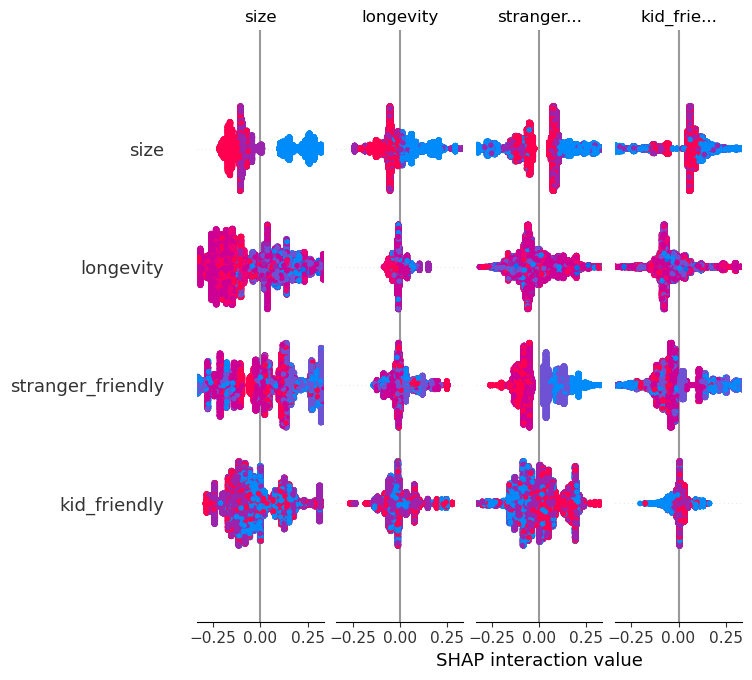

In [17]:
# Summary plot to visualize feature importance with correct feature names
# Convert X_test_filtered to DataFrame with correct column names
X_test_filtered_df = pd.DataFrame(X_test_filtered, columns=X_filtered.columns)
shap.summary_plot(shap_values, X_test_filtered_df)

## LIME

In [21]:
# Convert X_train_filtered to a DataFrame
X_train_filtered_df = pd.DataFrame(X_train_filtered, columns=X_filtered.columns)
# LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_filtered_df.values, mode='classification', feature_names=X_filtered.columns)

In [28]:
# Save
# Save the filtered training data
with open('X_train_filtered_df.pkl', 'wb') as f:
    pickle.dump(X_train_filtered_df, f)

In [ ]:
# Load
with open('X_train_filtered_df.pkl', 'rb') as f:
    X_train_filtered_df = pickle.load(f)

In [22]:
instance_idx = 0
exp = explainer.explain_instance(X_test_filtered[instance_idx], rf_filtered.predict_proba, num_features=len(X_train_filtered_df.columns))
# Display explanation for 1st instance
exp.show_in_notebook(show_all=False)

In [23]:
# Verify lengths of X_test_filtered_df and y_test
print(f"Length of X_test_filtered_df: {len(X_test_filtered_df)}")
print(f"Length of y_test: {len(y_test)}")

# Instances to explain
instance_indices = [0, 1, 2, 3]  # Explaining first four instances

for instance_idx in instance_indices:
    if instance_idx < len(X_test_filtered_df):
        # Generate the explanation
        exp = explainer.explain_instance(
            X_test_filtered_df.iloc[instance_idx], 
            rf_filtered.predict_proba, 
            num_features=len(X_train_filtered_df.columns)
        )

        # Display the explanation 
        print(f"### Explanation for Instance {instance_idx} ###")
        exp.show_in_notebook(show_all=False)
        
        # Print the predicted probabilities
        print(f"Predicted Probabilities: {rf_filtered.predict_proba([X_test_filtered_df.iloc[instance_idx]])}")

        # Print the actual label
        if instance_idx < len(y_test):
            print(f"Actual Label: {y_test.iloc[instance_idx]}")
        else:
            print(f"No actual label available for instance {instance_idx}")
        
        print("----------------------------------------------")
    else:
        print(f"Instance index {instance_idx} is out of bounds for X_test_filtered_df")

Length of X_test_filtered_df: 38100
Length of y_test: 38100
### Explanation for Instance 0 ###


Predicted Probabilities: [[0. 0. 1. 0.]]
Actual Label: Lowest
----------------------------------------------
### Explanation for Instance 1 ###


Predicted Probabilities: [[0. 1. 0. 0.]]
Actual Label: Low
----------------------------------------------
### Explanation for Instance 2 ###


Predicted Probabilities: [[1. 0. 0. 0.]]
Actual Label: High
----------------------------------------------
### Explanation for Instance 3 ###


Predicted Probabilities: [[1. 0. 0. 0.]]
Actual Label: High
----------------------------------------------


In [24]:
# Verify lengths of X_test_filtered_df and y_test
print(f"Length of X_test_filtered_df: {len(X_test_filtered_df)}")
print(f"Length of y_test: {len(y_test)}")

# Instances to explain
instance_indices = [100, 101, 102, 103]  # four instances

for instance_idx in instance_indices:
    if instance_idx < len(X_test_filtered_df):
        # Generate the explanation
        exp = explainer.explain_instance(
            X_test_filtered_df.iloc[instance_idx], 
            rf_filtered.predict_proba, 
            num_features=len(X_train_filtered_df.columns)
        )

        # Display the explanation 
        print(f"### Explanation for Instance {instance_idx} ###")
        exp.show_in_notebook(show_all=False)
        
        # Print the predicted probabilities
        print(f"Predicted Probabilities: {rf_filtered.predict_proba([X_test_filtered_df.iloc[instance_idx]])}")

        # Print the actual label 
        if instance_idx < len(y_test):
            print(f"Actual Label: {y_test.iloc[instance_idx]}")
        else:
            print(f"No actual label available for instance {instance_idx}")
        
        print("----------------------------------------------")
    else:
        print(f"Instance index {instance_idx} is out of bounds for X_test_filtered_df")

Length of X_test_filtered_df: 38100
Length of y_test: 38100
### Explanation for Instance 100 ###


Predicted Probabilities: [[0. 0. 0. 1.]]
Actual Label: Medium
----------------------------------------------
### Explanation for Instance 101 ###


Predicted Probabilities: [[0. 1. 0. 0.]]
Actual Label: Low
----------------------------------------------
### Explanation for Instance 102 ###


Predicted Probabilities: [[0. 1. 0. 0.]]
Actual Label: Low
----------------------------------------------
### Explanation for Instance 103 ###


Predicted Probabilities: [[0. 0. 1. 0.]]
Actual Label: Lowest
----------------------------------------------


## Sensitivity analysis

In [25]:
# Sensitivity analysis

original_prediction = rf_filtered.predict(X_test_filtered_df.iloc[0:1, :])
print("Original Prediction:", original_prediction)

Original Prediction: ['Lowest']


C:\Users\Vero\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


In [26]:
# Test instances
instances_to_analyze = X_test_filtered_df.iloc[:4]

# list to store the results of sensitivity analysis
sensitivity_results = []

# Iterate through each instance
for idx, (_, instance) in enumerate(instances_to_analyze.iterrows()):
    print(f"Instance {idx + 1}:")
    print("Original Instance:")
    print(instance)
    
    # Store the original prediction
    original_prediction = rf_filtered.predict([instance.values])[0]
    original_prediction_prob = rf_filtered.predict_proba([instance.values])[0]
    print(f"Original Prediction: {original_prediction}")
    print(f"Original Prediction Probabilities: {original_prediction_prob}")
    
    # Perform sensitivity analysis by perturbing each feature
    for feature_idx, (feature_name, feature_value) in enumerate(instance.items()):
        # Create a copy of the original instance to perturb
        perturbed_instance = instance.copy()
        
        # Perturb the feature (1.0 was chosen after testing lower perturbance)
        perturbed_value = feature_value + 1.0  
        perturbed_instance[feature_name] = perturbed_value
        
        # Predict using the perturbed instance
        perturbed_prediction = rf_filtered.predict([perturbed_instance.values])[0]
        perturbed_prediction_prob = rf_filtered.predict_proba([perturbed_instance.values])[0]
        
        # Calculate the change in prediction probability for the perturbed feature
        change_in_prob = perturbed_prediction_prob - original_prediction_prob
        
        # Store the sensitivity analysis result
        sensitivity_results.append({
            'Instance': idx + 1,
            'Feature': feature_name,
            'Original Prediction': original_prediction,
            'Perturbed Prediction': perturbed_prediction,
            'Change in Probability': change_in_prob
        })
        
        print(f"Perturbed Feature: {feature_name}")
        print(f"Perturbed Prediction: {perturbed_prediction}")
        print(f"Change in Prediction Probability: {change_in_prob}")
        print("----------------------------------------------")

Instance 1:
Original Instance:
stranger_friendly           0.479052
kid_friendly                0.012095
size                       -1.192281
longevity                   1.382724
dog_friendly                0.327438
exercise_needs              0.384083
severity_score             -0.377276
intelligence_category       0.563992
tolerates_cold_weather     -0.054997
prey_drive                  0.657578
energy_level                0.454894
wanderlust_potential        0.887029
sensitivity_level          -0.644002
tendency_to_bark_or_howl    1.528186
potential_for_mouthiness    1.136381
category_sporting          -0.482711
tolerates_being_alone       1.382054
tolerates_hot_weather       0.259281
category_terrier            2.184817
hips                       -0.992157
thyroid                    -0.580381
category_companion         -0.495148
Name: 0, dtype: float64
Original Prediction: Lowest
Original Prediction Probabilities: [0. 0. 1. 0.]
Perturbed Feature: stranger_friendly
Perturbed Predict

Perturbed Feature: thyroid
Perturbed Prediction: Low
Change in Prediction Probability: [0. 0. 0. 0.]
----------------------------------------------
Perturbed Feature: category_companion
Perturbed Prediction: Low
Change in Prediction Probability: [0. 0. 0. 0.]
----------------------------------------------
Instance 3:
Original Instance:
stranger_friendly          -0.509352
kid_friendly                0.012095
size                        1.137360
longevity                  -0.444390
dog_friendly               -0.895640
exercise_needs              0.384083
severity_score             -0.377276
intelligence_category       0.563992
tolerates_cold_weather      1.109112
prey_drive                 -0.486427
energy_level                0.454894
wanderlust_potential       -0.311404
sensitivity_level           1.214822
tendency_to_bark_or_howl    0.101130
potential_for_mouthiness   -0.107760
category_sporting          -0.482711
tolerates_being_alone       1.382054
tolerates_hot_weather       0.259

Perturbed Feature: thyroid
Perturbed Prediction: High
Change in Prediction Probability: [0. 0. 0. 0.]
----------------------------------------------
Perturbed Feature: category_companion
Perturbed Prediction: High
Change in Prediction Probability: [0. 0. 0. 0.]
----------------------------------------------


# Decision tree

In [33]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, classification_report, roc_auc_score
from sklearn.model_selection import cross_val_score

# Fit a Decision Tree model with regularization (limit depth of the tree)
dt = DecisionTreeClassifier(random_state=42, max_depth=10, min_samples_split=10, min_samples_leaf=5)
dt.fit(X_train_filtered, y_train)

# Evaluate the Decision Tree model
print("Decision Tree Model Performance:")

# Predictions on training and testing sets
y_train_pred_dt = dt.predict(X_train_filtered)
y_test_pred_dt = dt.predict(X_test_filtered)

# Calculate Accuracy, Precision, Recall, F1-score
train_accuracy_dt = accuracy_score(y_train, y_train_pred_dt)
test_accuracy_dt = accuracy_score(y_test, y_test_pred_dt)

precision_dt, recall_dt, f1_score_dt, _ = precision_recall_fscore_support(y_test, y_test_pred_dt, average='weighted')

print(f"Training Accuracy: {train_accuracy_dt}")
print(f"Testing Accuracy: {test_accuracy_dt}")
print(f"Precision: {precision_dt}")
print(f"Recall: {recall_dt}")
print(f"F1-score: {f1_score_dt}")

# Perform cross-validation
cv_scores_dt = cross_val_score(dt, X_filtered_scaled, y, cv=5, scoring='accuracy')

# Print cross-validation scores
print(f"Cross-validation accuracy scores: {cv_scores_dt}")
print(f"Mean cross-validation accuracy: {cv_scores_dt.mean()}")

# Classification report
print("Training Classification Report (Decision Tree):")
print(classification_report(y_train, y_train_pred_dt))
print("Testing Classification Report (Decision Tree):")
print(classification_report(y_test, y_test_pred_dt))

# ROC AUC score
train_roc_auc_dt = roc_auc_score(y_train, dt.predict_proba(X_train_filtered), multi_class='ovr')
test_roc_auc_dt = roc_auc_score(y_test, dt.predict_proba(X_test_filtered), multi_class='ovr')
print(f"Training ROC AUC (Decision Tree): {train_roc_auc_dt}")
print(f"Testing ROC AUC (Decision Tree): {test_roc_auc_dt}")

Decision Tree Model Performance:
Training Accuracy: 0.9662073490813649
Testing Accuracy: 0.9642782152230971
Precision: 0.9654977356639471
Recall: 0.9642782152230971
F1-score: 0.9644424253729907
Cross-validation accuracy scores: [0.72440945 0.90981627 0.83685039 0.52007874 0.6244357 ]
Mean cross-validation accuracy: 0.7231181102362205
Training Classification Report (Decision Tree):
              precision    recall  f1-score   support

        High       0.99      0.95      0.97     37833
         Low       0.97      0.94      0.96     38189
      Lowest       1.00      0.99      0.99     38340
      Medium       0.91      0.98      0.94     38038

    accuracy                           0.97    152400
   macro avg       0.97      0.97      0.97    152400
weighted avg       0.97      0.97      0.97    152400

Testing Classification Report (Decision Tree):
              precision    recall  f1-score   support

        High       0.99      0.94      0.96      9339
         Low       0.97  

In [34]:
# Save both models to disk
with open('models.pkl', 'wb') as f:
    pickle.dump({'random_forest': rf_filtered, 'decision_tree': dt}, f)

In [35]:
# Load the models from disk
with open('models.pkl', 'rb') as f:
    models = pickle.load(f)

loaded_rf_model = models['random_forest']
loaded_dt_model = models['decision_tree']

In [36]:
# load Random Forest model
loaded_test_pred_rf = loaded_rf_model.predict(X_test_filteed)
loaded_test_accuracy_rf = accuracy_score(y_test, loaded_test_pred_rf)
print(f"Loaded Random Forest Model Testing Accuracy: {loaded_test_accuracy_rf}")

Loaded Random Forest Model Testing Accuracy: 0.986745406824147


In [37]:
# Load Decision Tree model
loaded_test_pred_dt = loaded_dt_model.predict(X_test_filtered)
loaded_test_accuracy_dt = accuracy_score(y_test, loaded_test_pred_dt)
print(f"Loaded Decision Tree Model Testing Accuracy: {loaded_test_accuracy_dt}")

Loaded Decision Tree Model Testing Accuracy: 0.9642782152230971


# Hyperparameter Tuning with RandomizedSearchCV (both models)

In [40]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, classification_report, roc_auc_score
import pickle

# Define parameter grids
param_dist_rf = {
    'max_depth': [10, 20],
    'min_samples_split': [5, 20],
    'min_samples_leaf': [2, 10],
    'n_estimators': [50, 200]
}

param_dist_dt = {
    'max_depth': [10, 20],
    'min_samples_split': [5, 20],
    'min_samples_leaf': [2, 10]
}

# Randomized search for Random Forest
random_search_rf = RandomizedSearchCV(estimator=RandomForestClassifier(random_state=42),
                                      param_distributions=param_dist_rf,
                                      n_iter=5,  
                                      cv=5,
                                      scoring='accuracy',
                                      random_state=42)

random_search_rf.fit(X_train_filtered, y_train)
best_rf = random_search_rf.best_estimator_

# Randomized search for Decision Tree
random_search_dt = RandomizedSearchCV(estimator=DecisionTreeClassifier(random_state=42),
                                      param_distributions=param_dist_dt,
                                      n_iter=5,  
                                      cv=5,
                                      scoring='accuracy',
                                      random_state=42)

random_search_dt.fit(X_train_filtered, y_train)
best_dt = random_search_dt.best_estimator_

# Fit models with best parameters
best_rf.fit(X_train_filtered, y_train)
best_dt.fit(X_train_filtered, y_train)

# Save both models to disk
with open('models.pkl', 'wb') as f:
    pickle.dump({'random_forest': best_rf, 'decision_tree': best_dt}, f)

In [41]:
# Load the models from disk
with open('models.pkl', 'rb') as f:
    models = pickle.load(f)

loaded_rf_model = models['random_forest']
loaded_dt_model = models['decision_tree']

## Best parameters and scores

In [42]:
#Best parameters and scores for Random Forest
print("Random Forest Best Parameters:", random_search_rf.best_params_)
print("Random Forest Best Cross-validation Score:", random_search_rf.best_score_)

# Best parameters and scores for Decision Tree
print("Decision Tree Best Parameters:", random_search_dt.best_params_)
print("Decision Tree Best Cross-validation Score:", random_search_dt.best_score_)

# Detailed results for Random Forest
print("Random Forest CV Results:")
for mean_score, params in zip(random_search_rf.cv_results_['mean_test_score'], random_search_rf.cv_results_['params']):
    print(f"Mean Test Score: {mean_score}, Parameters: {params}")

# Detailed results for Decision Tree
print("Decision Tree CV Results:")
for mean_score, params in zip(random_search_dt.cv_results_['mean_test_score'], random_search_dt.cv_results_['params']):
    print(f"Mean Test Score: {mean_score}, Parameters: {params}")

Random Forest Best Parameters: {'n_estimators': 50, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_depth': 20}
Random Forest Best Cross-validation Score: 0.9955774278215224
Decision Tree Best Parameters: {'min_samples_split': 20, 'min_samples_leaf': 2, 'max_depth': 20}
Decision Tree Best Cross-validation Score: 0.9992979002624672
Random Forest CV Results:
Mean Test Score: 0.9890419947506561, Parameters: {'n_estimators': 50, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_depth': 10}
Mean Test Score: 0.9891863517060366, Parameters: {'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_depth': 10}
Mean Test Score: 0.9861876640419949, Parameters: {'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 10, 'max_depth': 10}
Mean Test Score: 0.9955774278215224, Parameters: {'n_estimators': 50, 'min_samples_split': 20, 'min_samples_leaf': 10, 'max_depth': 20}
Mean Test Score: 0.9955643044619423, Parameters: {'n_estimators': 200, 'min_samples_split': 5,